<h1>Step 0: Convert citation table to citation edgelist</h1>

In [1]:
import csv

def convert_csv_to_edgelist(input_csv, output_txt):
    with open(input_csv, 'r', newline='', encoding='utf-8') as csvfile:
        reader = csv.reader(csvfile)
        next(reader) 
        with open(output_txt, 'w', encoding='utf-8') as txtfile:
            for row in reader:
                citing_paper_id, cited_paper_id = row[1], row[2]
                txtfile.write(f"{citing_paper_id} {cited_paper_id}\n")

In [2]:
convert_csv_to_edgelist("data/norm/dataset/csv/citations.csv", "data/norm/metadata/edge_list.txt")
convert_csv_to_edgelist("data/pred/dataset/csv/citations.csv", "data/pred/metadata/edge_list.txt")


<h1>Step 1: Louvain Clustering</h1>

Note: If you just want to comfirm our data, you can skip this step, and use the lovain result we saved at “/data/[norm/pred]/metadata/louvain” to run the rest of steps. The louvain results return form this step may vary each time, but the general group citation pattern should be the same.

In [ ]:
from community import community_louvain
import networkx as nx
from collections import defaultdict
from sklearn.metrics import silhouette_score
import numpy as np
import random
import csv


# -------------------------------
# Logger for console + file output
# -------------------------------
class Logger:
    def __init__(self, log_file):
        self.log_file = log_file
        with open(self.log_file, 'w') as f:
            f.write("")

    def log(self, message):
        print(message)
        with open(self.log_file, 'a') as f:
            f.write(message + "\n")


# -------------------------------
# Load edges from file
# -------------------------------
def load_citation_edges(file_path):
    edges = []
    with open(file_path, 'r') as f:
        for line in f:
            src, dst = map(int, line.strip().split())
            edges.append((src, dst))
    return edges


# -------------------------------
# Save clustering results to CSV
# -------------------------------
def save_results_to_csv(resolution, community_dict, silhouette_score_value, output_file):
    with open(output_file, 'a', newline='') as csvfile:
        csvwriter = csv.writer(csvfile)
        csvwriter.writerow([f"Resolution: {resolution}", f"Silhouette Score: {silhouette_score_value}"])
        csvwriter.writerow(["Community ID", "Number of Nodes", "Nodes"])
        for community_id, nodes in community_dict.items():
            csvwriter.writerow([community_id, len(nodes), ', '.join(map(str, nodes))])
        csvwriter.writerow([])  # blank line
    logger.log(f"Results for resolution {resolution} saved to {output_file}")


# -------------------------------
# Build NetworkX graph
# -------------------------------
def build_graph(edges):
    G = nx.Graph()
    G.add_edges_from(edges)
    return G


# -------------------------------
# Louvain clustering (reproducible)
# -------------------------------
def perform_louvain_clustering(G, resolution=1.0, seed=42):
    # random_state ensures reproducibility
    partition = community_louvain.best_partition(G, resolution=resolution, random_state=seed)
    return partition


# -------------------------------
# Analyze and log community info
# -------------------------------
def analyze_communities(partition):
    community_dict = defaultdict(list)
    for node, community_id in partition.items():
        community_dict[community_id].append(node)

    for community_id, nodes in community_dict.items():
        logger.log(f"Community {community_id}: {len(nodes)} nodes")
        logger.log(f"Nodes: {nodes}")
        logger.log("-" * 40)

    return community_dict


# -------------------------------
# Compute silhouette score
# -------------------------------
def calculate_silhouette_score(G, partition):
    nodes = list(G.nodes())
    labels = [partition[node] for node in nodes]

    # compute shortest-path distance matrix
    length_matrix = nx.floyd_warshall_numpy(G)
    distance_matrix = np.array(length_matrix)

    max_distance = np.max(distance_matrix[np.isfinite(distance_matrix)])
    distance_matrix[~np.isfinite(distance_matrix)] = max_distance * 2  # handle disconnected pairs

    try:
        score = silhouette_score(distance_matrix, labels, metric="precomputed")
    except ValueError as e:
        score = None
        logger.log(f"Silhouette Score calculation failed: {e}")
    
    return score


# -------------------------------
# Main pipeline
# -------------------------------
def main():
    global logger
    logger = Logger("data/norm/metadata/louvain/training_log.txt")

    # fix all random sources
    SEED = 42
    random.seed(SEED)
    np.random.seed(SEED)

    # load data
    file_path = "data/norm/metadata/edge_list.txt"
    edges = load_citation_edges(file_path)
    G = build_graph(edges)

    output_csv = "data/norm/metadata/louvain/clustering_results.csv"
    with open(output_csv, 'w', newline='') as csvfile:
        csvwriter = csv.writer(csvfile)
        csvwriter.writerow(["Louvain Clustering Results"])
        csvwriter.writerow([])

    resolutions = [0.8, 1.0, 1.8, 2.0, 5.0]

    for resolution in resolutions:
        logger.log(f"Running Louvain clustering with resolution: {resolution}")

        # reproducible Louvain partition
        partition = perform_louvain_clustering(G, resolution=resolution, seed=SEED)

        community_dict = analyze_communities(partition)
        logger.log(f"Total communities detected: {len(community_dict)}")

        silhouette = calculate_silhouette_score(G, partition)
        logger.log(f"Silhouette Score for resolution {resolution}: {silhouette}")

        save_results_to_csv(resolution, community_dict, silhouette, output_csv)
        logger.log("=" * 60)


if __name__ == "__main__":
    main()


<h1>Step 2: Draw citation network</h1>

In [89]:

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
import matplotlib.colors as mcolors
import os
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Super Node Aggregation 
def new_create_super_nodes(G, merge_threshold=0.8):
    """
    All nodes with an out-degree > 1 (regardless of whether they originally had identical references) are merged using an 80% threshold.
    Nodes with an out-degree == 1 are still grouped as identical. Nodes without references are added individually.
    """
    # Used to store nodes with out-degree == 1, grouped by exact reference sets.
    pattern_map = {}
    # Used to store nodes with out-degree > 1, each node as a candidate group.
    candidate_groups = []
    # Nodes without references.
    single_nodes = []

    for node in G.nodes():
        out_neighbors = set(G[node])
        if not out_neighbors:
            single_nodes.append(node)
        else:
            if len(out_neighbors) == 1:
                key = frozenset(out_neighbors)
                pattern_map.setdefault(key, []).append(node)
            else:
                candidate_groups.append({"pattern": out_neighbors, "nodes": [node]})

    # Non-merged group: nodes with out-degree == 1
    non_merge_groups = []
    for pattern, nodes in pattern_map.items():
        non_merge_groups.append({"pattern": set(pattern), "nodes": nodes})

    # All candidate groups with out-degree > 1 are merged using a threshold of 80% (regardless of whether there is only a single node in the group initially)
    n = len(candidate_groups)
    parent = list(range(n))

    def find(i):
        while parent[i] != i:
            parent[i] = parent[parent[i]]
            i = parent[i]
        return i

    def union(i, j):
        root_i = find(i)
        root_j = find(j)
        if root_i != root_j:
            parent[root_j] = root_i

    for i in range(n):
        for j in range(i + 1, n):
            pattern_i = candidate_groups[i]["pattern"]
            pattern_j = candidate_groups[j]["pattern"]
            union_set = pattern_i | pattern_j
            if union_set:
                jaccard = len(pattern_i & pattern_j) / len(union_set)
                if jaccard >= merge_threshold:
                    union(i, j)

    clusters = {}
    for i in range(n):
        root = find(i)
        clusters.setdefault(root, []).append(candidate_groups[i])

    merged_candidate_groups = []
    for cluster in clusters.values():
        if len(cluster) == 1:
            merged_candidate_groups.append(cluster[0])
        else:
            merged_pattern = set()
            merged_nodes = []
            for group in cluster:
                merged_pattern |= group["pattern"]
                merged_nodes.extend(group["nodes"])
            merged_candidate_groups.append({"pattern": merged_pattern, "nodes": merged_nodes})

    final_groups = non_merge_groups + merged_candidate_groups

    super_graph = nx.DiGraph()
    node_map = {}
    idx = 0
    for group in final_groups:
        super_node = f"Super_{idx}"
        idx += 1
        node_map[super_node] = group["nodes"]
        super_graph.add_node(super_node, size=len(group["nodes"]))
        for target in group["pattern"]:
            super_graph.add_edge(super_node, target)

    for n in single_nodes:
        super_graph.add_node(n, size=1)
        for target in G[n]:
            super_graph.add_edge(n, target)

    return super_graph, node_map

def filter_edge_list(edge_list_file, nodes_in_community):
    filtered_edges = []
    with open(edge_list_file, 'r') as f:
        for line in f:
            src, dst = map(int, line.strip().split())
            if src in nodes_in_community and dst in nodes_in_community:
                filtered_edges.append((src, dst))
    return filtered_edges

def visualize_5_rows_with_custom_colors(edge_list, community_data, community_id, rank, save_folder,
                                        out_deg_max=100, in_deg_max=100,
                                        blue_colors=["#c8edf7", "#535fad", "#a3245d"],
                                        orange_colors=["#fff9a0", "#3eb562", "#d95f0e"]):
   
    row = community_data[community_data['Community ID'] == community_id]
    if row.empty:
        print(f"Community {community_id} not found.")
        return

    node_list = list(map(int, row.iloc[0]['Nodes'].split(',')))

    G = nx.DiGraph()
    sub_edges = [(s, t) for s, t in edge_list if s in node_list and t in node_list]
    G.add_edges_from(sub_edges)

    super_graph, node_map = new_create_super_nodes(G)

    def is_real_super(n):
        return isinstance(n, str) and n.startswith("Super_") and super_graph.nodes[n].get('size', 1) > 1

    target_nodes = [n for n in super_graph.nodes() if super_graph.out_degree(n) == 0]
    blue_nodes   = [n for n in super_graph.nodes() if super_graph.out_degree(n) > 0]

    row1_nodes = [n for n in blue_nodes if super_graph.out_degree(n) == 1 and not is_real_super(n)]
    row2_nodes = [n for n in blue_nodes if super_graph.out_degree(n) == 1 and is_real_super(n)]
    row3_nodes = [n for n in blue_nodes if super_graph.out_degree(n) > 1 and not is_real_super(n)]
    row4_nodes = [n for n in blue_nodes if super_graph.out_degree(n) > 1 and is_real_super(n)]

    row2_nodes = sorted(row2_nodes, key=lambda n: super_graph.nodes[n].get('size', 1))
    row4_nodes = sorted(row4_nodes, key=lambda n: super_graph.nodes[n].get('size', 1))

    
    # === Row4 Super Node statistics ===
    row4_supers = [n for n in row4_nodes if is_real_super(n)]
    stats_rows = []
    for sn in row4_supers:
        members = sorted(node_map.get(sn, [])) 
        stats_rows.append({
            "super_node": sn,
            "num_nodes_in_super": super_graph.nodes[sn].get('size', 1), 
            "num_out_edges": super_graph.out_degree(sn),                  
            "members": ",".join(map(str, members))                      
        })

    if stats_rows:
        df_row4_stats = pd.DataFrame(stats_rows)\
            .sort_values(["num_nodes_in_super", "num_out_edges", "super_node"],
                         ascending=[False, False, True])\
            .reset_index(drop=True)
    else:
        df_row4_stats = pd.DataFrame(columns=["super_node", "num_nodes_in_super", "num_out_edges", "members"])

    print(f"[Stats] Community {community_id} - Row4 super nodes: {len(df_row4_stats)}")
    if not df_row4_stats.empty:
        df_preview = df_row4_stats.copy()
        df_preview["members"] = df_preview["members"].str.slice(0, 200) + "..."
        print(df_preview.to_string(index=False))

    stats_path = os.path.join(save_folder, f"row4_supernode_stats_com_{community_id}.csv")
    df_row4_stats.to_csv(stats_path, index=False)
    print(f"[Stats] Saved: {stats_path}")

    pos = {}

    def assign_positions(nodes, y_level):
        if not nodes:
            return
        x_coords = np.linspace(0, 2, len(nodes))
        for i, n in enumerate(nodes):
            pos[n] = (x_coords[i], y_level)

    assign_positions(row1_nodes, 0.9)
    assign_positions(row2_nodes, 0.7)
    assign_positions(row3_nodes, 0.55)
    assign_positions(row4_nodes, 0.4)

    target_nodes_sorted = sorted(target_nodes, key=lambda n: super_graph.in_degree(n))
    assign_positions(target_nodes_sorted, 0.0)

    GAMMA = 0.5

    cmap_out = mcolors.LinearSegmentedColormap.from_list("blue_grad", blue_colors)
    cmap_in  = mcolors.LinearSegmentedColormap.from_list("orange_grad", orange_colors)

    norm_out = mcolors.PowerNorm(gamma=GAMMA, vmin=0, vmax=out_deg_max)
    norm_in  = mcolors.PowerNorm(gamma=GAMMA, vmin=0, vmax=in_deg_max)

    def get_blue_color(n):
        return cmap_out(norm_out(super_graph.out_degree(n)))

    def get_orange_color(n):
        return cmap_in(norm_in(super_graph.in_degree(n)))

    def get_node_size(n):
        return super_graph.nodes[n].get('size', 1) * 100

    row1_colors = [get_blue_color(n) for n in row1_nodes]
    row2_colors = [get_blue_color(n) for n in row2_nodes]
    row3_colors = [get_blue_color(n) for n in row3_nodes]
    row4_colors = [get_blue_color(n) for n in row4_nodes]
    row5_colors = [get_orange_color(n) for n in target_nodes_sorted]

    row1_sizes = [get_node_size(n) for n in row1_nodes]
    row2_sizes = [get_node_size(n) for n in row2_nodes]
    row3_sizes = [get_node_size(n) for n in row3_nodes]
    row4_sizes = [get_node_size(n) for n in row4_nodes]
    row5_sizes = [get_node_size(n) for n in target_nodes_sorted]

    edges_to_draw = [(u, v) for (u, v) in super_graph.edges() if u in row4_nodes]

    edge_cmap = mpl.colors.LinearSegmentedColormap.from_list("custom_grey", ["#aebdbb", "#5e666e"])
    edge_colors = [edge_cmap(norm_out(super_graph.out_degree(u))) for (u, v) in edges_to_draw]
    # edge_colors = "#82878c"

    fig, ax = plt.subplots(figsize=(18, 12))

    ax.axis("off")

    nx.draw_networkx_nodes(super_graph, pos, nodelist=row1_nodes, node_color=row1_colors, node_size=row1_sizes,
                           alpha=1.0, ax=ax, linewidths=0.8, edgecolors='grey')
    nx.draw_networkx_nodes(super_graph, pos, nodelist=row2_nodes, node_color=row2_colors, node_size=row2_sizes,
                           alpha=1.0, ax=ax, linewidths=0.8, edgecolors='grey')
    nx.draw_networkx_nodes(super_graph, pos, nodelist=row3_nodes, node_color=row3_colors, node_size=row3_sizes,
                           alpha=1.0, ax=ax, linewidths=0.8, edgecolors='grey')
    nx.draw_networkx_nodes(super_graph, pos, nodelist=row4_nodes, node_color=row4_colors, node_size=row4_sizes,
                           alpha=1.0, ax=ax, linewidths=0.8, edgecolors='grey')
    nx.draw_networkx_nodes(super_graph, pos, nodelist=target_nodes_sorted, node_color=row5_colors, node_size=row5_sizes,
                           alpha=1.0, ax=ax, linewidths=0.8, edgecolors='grey')

    nx.draw_networkx_edges(super_graph, pos, edgelist=edges_to_draw, edge_color=edge_colors, width=1,
                           alpha=0.8, ax=ax)

    # if row2_nodes:
    #     largest_row2 = max(row2_nodes, key=lambda n: super_graph.nodes[n].get('size', 1))
    #     ax.annotate(f"Size: {super_graph.nodes[largest_row2].get('size', 1)}", 
    #                 xy=pos[largest_row2], 
    #                 xytext=(pos[largest_row2][0], pos[largest_row2][1] + 0.1),
    #                 arrowprops=dict(arrowstyle="->", color="black"),
    #                 fontsize=12, 
    #                 ha='center')

    # if row4_nodes:
    #     largest_row4 = max(row4_nodes, key=lambda n: super_graph.nodes[n].get('size', 1))
    #     ax.annotate(f"Size: {super_graph.nodes[largest_row4].get('size', 1)}", 
    #                 xy=pos[largest_row4], 
    #                 xytext=(pos[largest_row4][0], pos[largest_row4][1] + 0.1),
    #                 arrowprops=dict(arrowstyle="->", color="black"),
    #                 fontsize=12, 
    #                 ha='center')


    if row2_nodes:
        largest_row2 = max(row2_nodes, key=lambda n: super_graph.nodes[n].get('size', 1))
        ax.text(pos[largest_row2][0], pos[largest_row2][1],
                f"{super_graph.nodes[largest_row2].get('size', 1)}",
                fontsize=12, color='black', ha='center', va='center')

    if row4_nodes:
        largest_row4 = max(row4_nodes, key=lambda n: super_graph.nodes[n].get('size', 1))
        ax.text(pos[largest_row4][0], pos[largest_row4][1],
                f"{super_graph.nodes[largest_row4].get('size', 1)}",
                fontsize=12, color='black', ha='center', va='center')


    label_x = -0.45
    ax.text(-0.5, 0.95, "Normal Citation Behaviors", ha='left', va='center', fontsize=15, fontweight='bold')

    ax.text(label_x, 0.9, "Row 1: Single Citation", ha='left', va='center', fontsize=13)
    ax.text(label_x, 0.7, "Row 2: Popular Paper", ha='left', va='center', fontsize=13)
    ax.text(label_x, 0.55, "Row 3: Reference List", ha='left', va='center', fontsize=13)

    ax.text(-0.5, 0.45, "Suspicious Citation Behaviors", ha='left', va='center', fontsize=15, fontweight='bold')
    ax.text(label_x, 0.4, "Row 4: Group Citation", ha='left', va='center', fontsize=13)

    ax.text(label_x, 0.0, "Row 5: Cited Papers", ha='left', va='center', fontsize=13)

    ax.text(0, -0.1, "Arrows indicate citation: citing → cited", ha='left', va='center', fontsize=13, style='italic')


    divider = make_axes_locatable(ax)
    cax_out = divider.append_axes("right", size="2%", pad=0.2)
    sm_out = mpl.cm.ScalarMappable(norm=norm_out, cmap=cmap_out)
    cbar_out = plt.colorbar(sm_out, cax=cax_out)
    cbar_out.set_label('Out-degree (Citing)', fontsize=10)

    cax_in = divider.append_axes("right", size="2%", pad=0.6)
    sm_in = mpl.cm.ScalarMappable(norm=norm_in, cmap=cmap_in)
    cbar_in = plt.colorbar(sm_in, cax=cax_in)
    cbar_in.set_label('In-degree (Cited)', fontsize=10)

    all_x = [p[0] for p in pos.values()]
    xmin = min(all_x)
    xmax = max(all_x)
    ax.set_xlim(xmin - 0.1, xmax + 0.4)
    ax.set_ylim(-0.12, 0.92)

    output_path = os.path.join(save_folder, f"TOP_{rank}_com_{community_id}.png")

    plt.savefig(output_path, format="png", dpi=300, bbox_inches='tight', pad_inches=0.05)
    plt.show()



Citation Network for Normal Set

[Stats] Community 0 - Row4 super nodes: 12
super_node  num_nodes_in_super  num_out_edges                members
  Super_34                   5              2 325,334,350,361,383...
  Super_40                   3              2         768,769,774...
  Super_21                   2              8              42,129...
  Super_24                   2              5             118,859...
  Super_20                   2              3             106,766...
  Super_23                   2              3              79,117...
  Super_14                   2              2              10,101...
  Super_19                   2              2               36,81...
  Super_27                   2              2             154,219...
  Super_28                   2              2             164,199...
  Super_31                   2              2             178,214...
  Super_41                   2              2             773,777...
[Stats] Saved: data/norm/metadata/louvain/network_diagram/ro

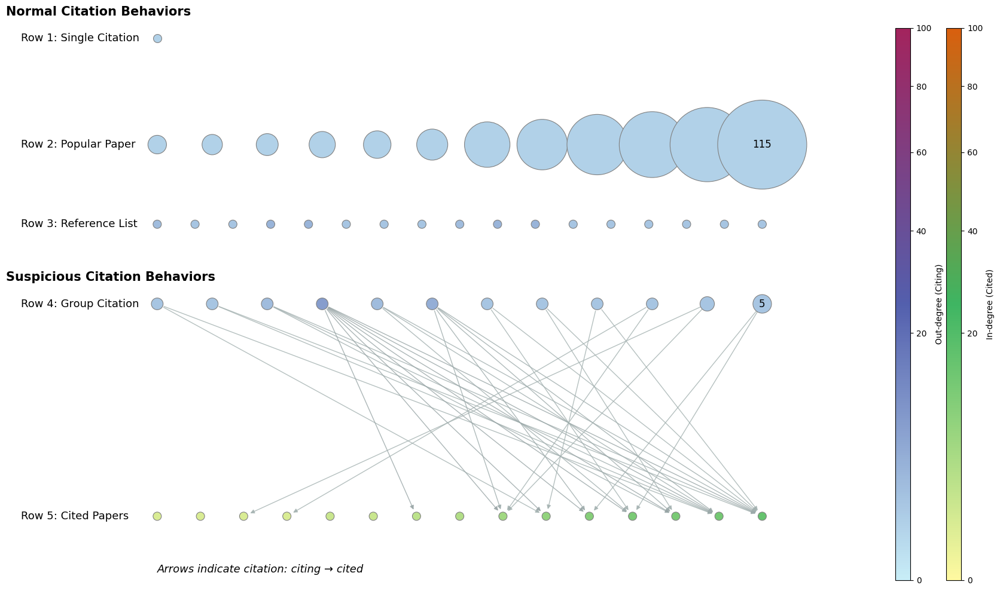

[Stats] Community 53 - Row4 super nodes: 3
super_node  num_nodes_in_super  num_out_edges                                                                                                                                                  members
   Super_5                  30              2 2699,2702,2703,2708,2710,2711,2729,2733,2738,2739,2744,2774,2786,2809,2830,2842,2855,2860,2870,2872,2893,2901,2907,2911,2917,2919,2921,2933,2941,2942...
   Super_6                   4              2                                                                                                                                   2754,2771,2833,2890...
   Super_8                   2              3                                                                                                                                             2836,2948...
[Stats] Saved: data/norm/metadata/louvain/network_diagram/row4_supernode_stats_com_53.csv


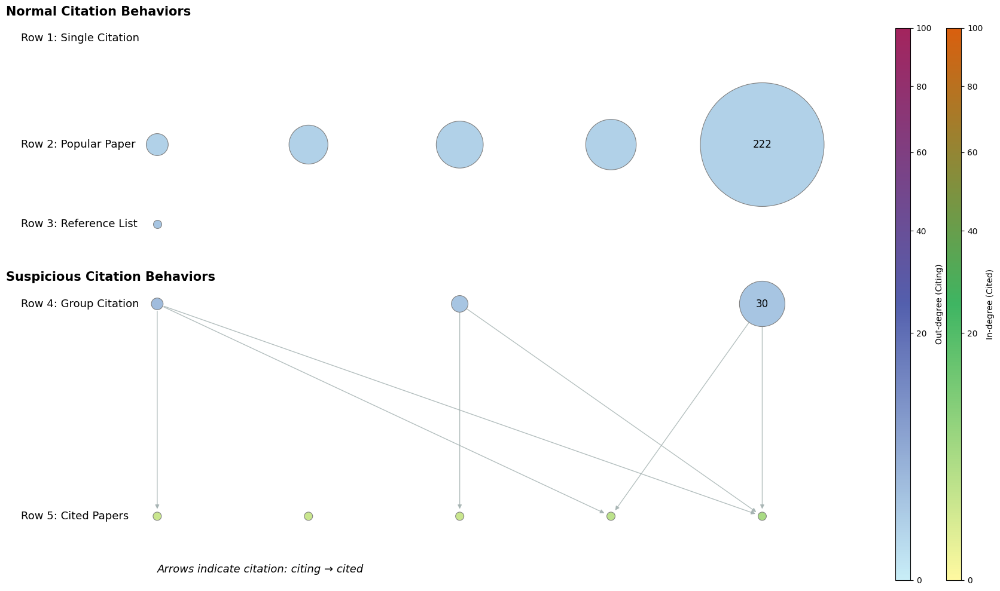

[Stats] Community 147 - Row4 super nodes: 7
super_node  num_nodes_in_super  num_out_edges                          members
  Super_15                   6              2 6497,6499,6507,6508,6513,6526...
  Super_21                   4              2           6559,6583,6608,6610...
  Super_16                   2              4                     6401,6480...
  Super_18                   2              3                     6509,6551...
  Super_22                   2              2                     6572,6576...
  Super_25                   2              2                     6711,6721...
  Super_29                   2              2                     6737,6742...
[Stats] Saved: data/norm/metadata/louvain/network_diagram/row4_supernode_stats_com_147.csv


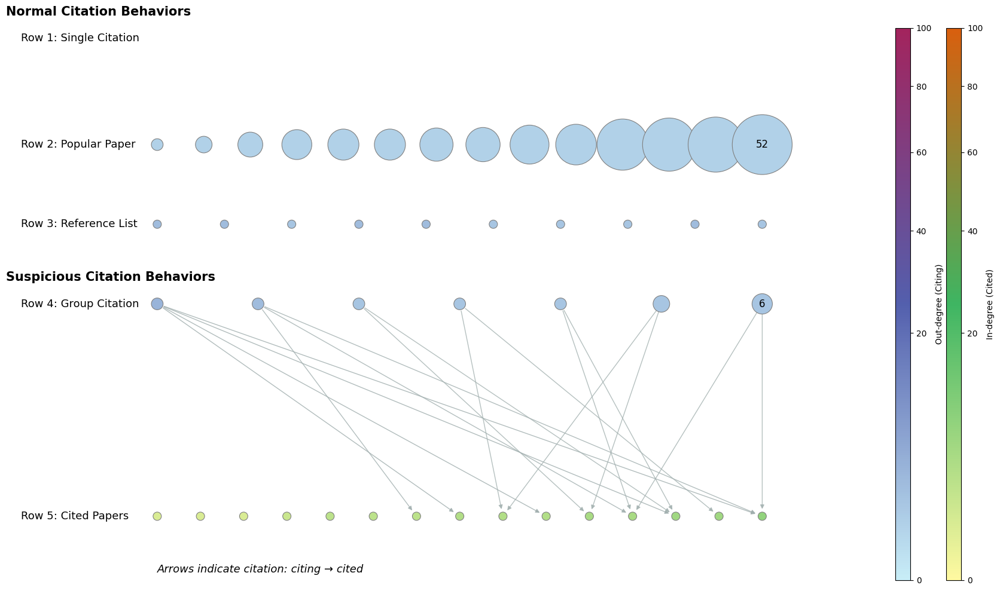

[Stats] Community 176 - Row4 super nodes: 5
super_node  num_nodes_in_super  num_out_edges                               members
  Super_13                   7              2 8575,8628,8648,8649,8654,8675,8933...
  Super_19                   6              2      8711,8717,8723,8729,8731,8741...
  Super_18                   2              3                          8804,8953...
  Super_14                   2              2                          8579,8636...
  Super_24                   2              2                          8816,8829...
[Stats] Saved: data/norm/metadata/louvain/network_diagram/row4_supernode_stats_com_176.csv


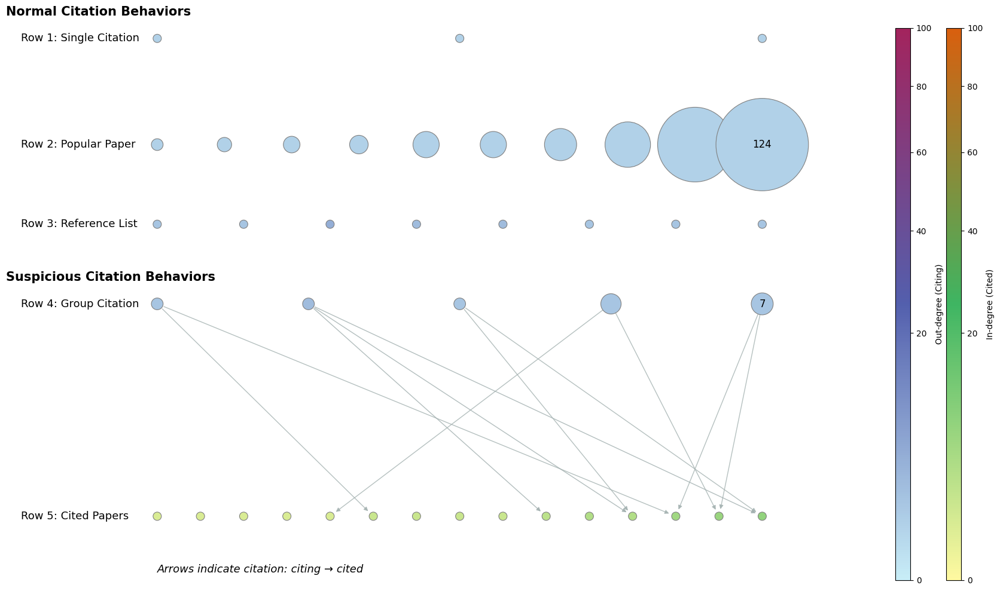

[Stats] Community 160 - Row4 super nodes: 1
super_node  num_nodes_in_super  num_out_edges                               members
   Super_6                   7              2 7562,7598,7602,7621,7625,7633,7722...
[Stats] Saved: data/norm/metadata/louvain/network_diagram/row4_supernode_stats_com_160.csv


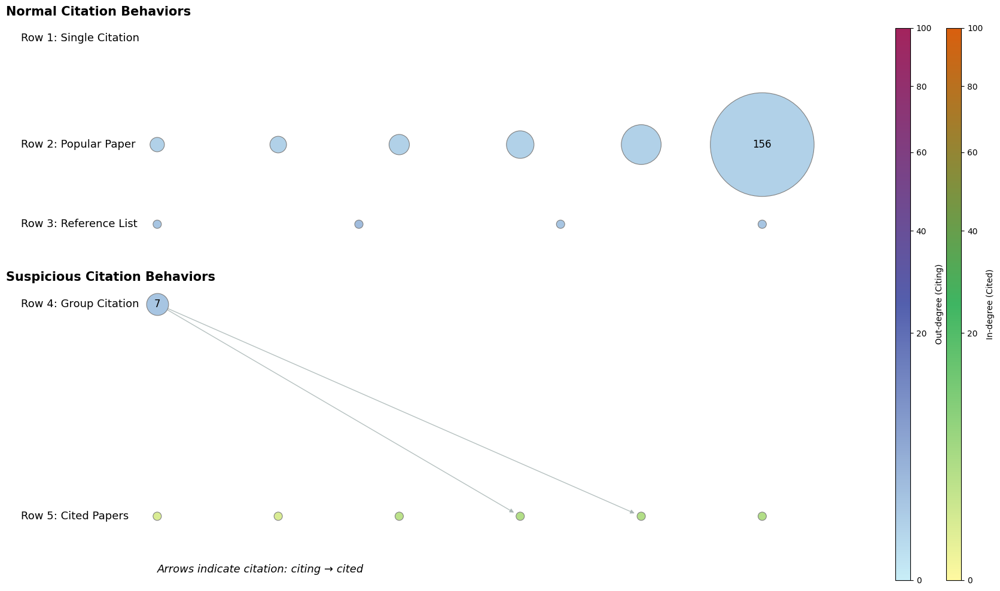

In [90]:
def main():
    #Norm Data
    csv_file = "data/norm/metadata/louvain/best_louvain_reso_1.csv" 
    edge_list_file = "data/norm/metadata/edge_list.txt" 
    save_folder = "data/norm/metadata/louvain/network_diagram"
   
    community_data = pd.read_csv(csv_file)
    top_communities = community_data.nlargest(5, 'Number of Nodes').reset_index(drop=True)

    for rank, row in top_communities.iterrows():
        target_community_id = row['Community ID']
        all_nodes = set(map(int, row['Nodes'].split(',')))
        filtered_edges = filter_edge_list(edge_list_file, all_nodes)

        visualize_5_rows_with_custom_colors(
            filtered_edges,
            community_data,
            target_community_id,
            rank + 1, 
            save_folder,
            out_deg_max=100,
            in_deg_max=100,
            blue_colors=["#c8edf7", "#535fad", "#a3245d"],
            orange_colors=["#fff9a0", "#3eb562", "#d95f0e"]
        )

if __name__ == "__main__":
    main()

Citation Network for Predatory Set

[Stats] Community 19 - Row4 super nodes: 13
super_node  num_nodes_in_super  num_out_edges                                                                                           members
  Super_51                  19             22 6293,6422,6433,6434,6436,6437,6438,6442,6443,6445,6449,6452,6454,6473,6499,6501,6502,6509,8421...
  Super_61                   8             20                                                        6470,6471,6482,6483,6484,6497,6498,6500...
  Super_47                   4             14                                                                            6396,6416,6418,6419...
  Super_52                   4              5                                                                            6423,6431,6465,6466...
  Super_67                   4              2                                                                             455,6530,6532,6533...
  Super_49                   3              9                                               

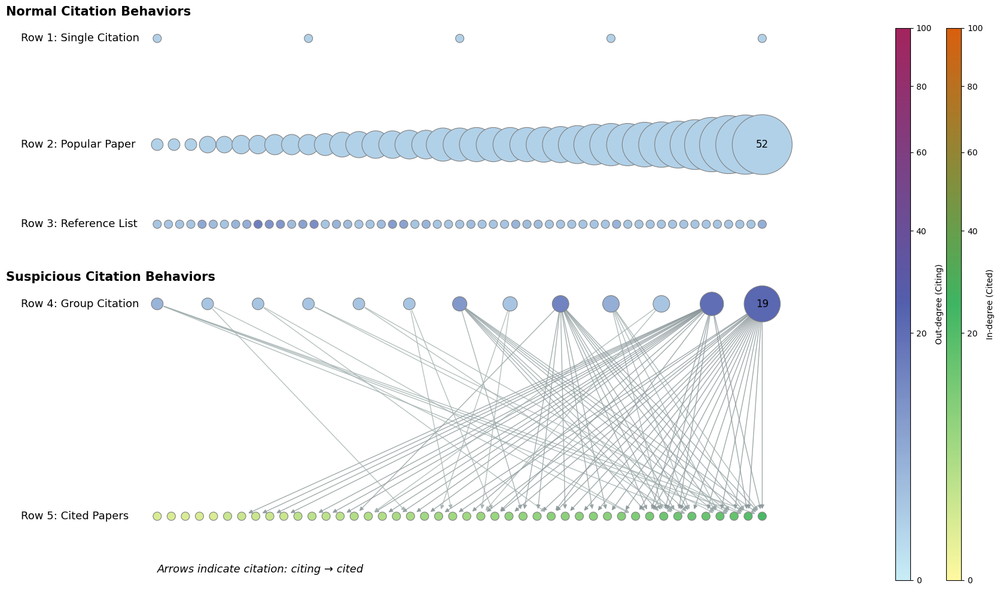

[Stats] Community 4 - Row4 super nodes: 16
super_node  num_nodes_in_super  num_out_edges                                                                                                                                                                                         members
 Super_105                  38              5 840,1012,1478,3497,4200,4222,4290,4348,4408,4409,4410,4411,4412,4414,4416,4419,4420,4421,4423,4426,4427,4428,4429,4434,4436,4439,4440,4441,4444,4445,4446,4447,4450,4454,4455,4456,4459,4461...
  Super_97                  13              2                                                                                                                                          861,889,890,892,893,896,897,898,900,901,902,903,904...
 Super_129                   4             19                                                                                                                                                                          1139,1140,1141,1146...
 Supe

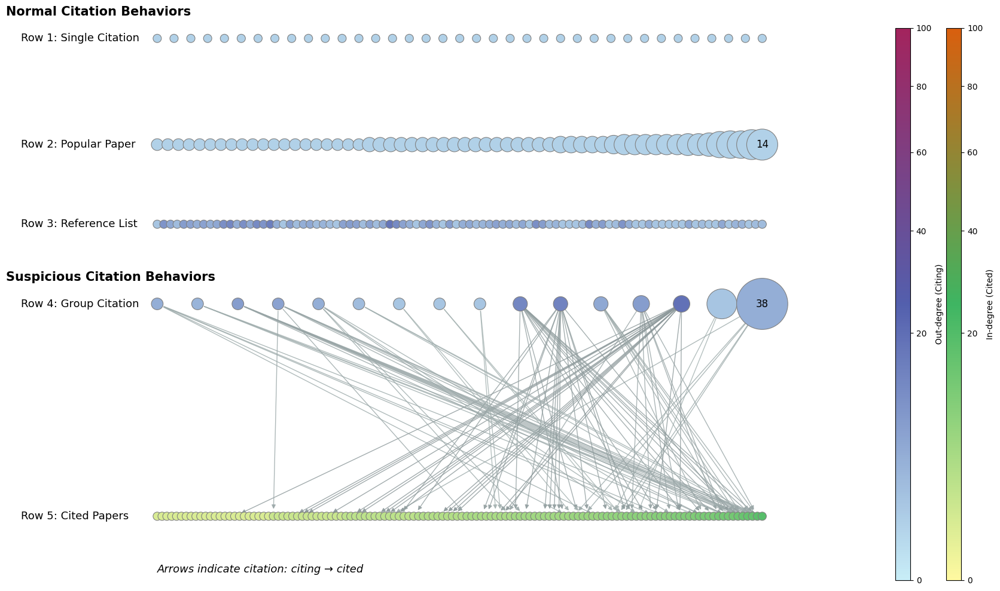

[Stats] Community 14 - Row4 super nodes: 21
super_node  num_nodes_in_super  num_out_edges                                                                                                members
 Super_128                  20              2 3821,3822,3823,3824,3825,3826,3827,3828,3829,3830,3831,3832,3834,3835,3836,3837,3838,3839,3840,3841...
 Super_130                  16              2                     3845,3848,3849,3850,3851,3853,3854,3855,3856,3857,3858,3860,3861,3862,3863,3864...
 Super_133                   9              2                                                        3867,3868,3869,3870,3871,3872,3873,3874,3875...
 Super_110                   8              2                                                             1435,1438,1439,1440,1441,1442,1444,1445...
  Super_74                   7             91                                                                         474,476,477,487,488,489,491...
  Super_81                   6             42                 

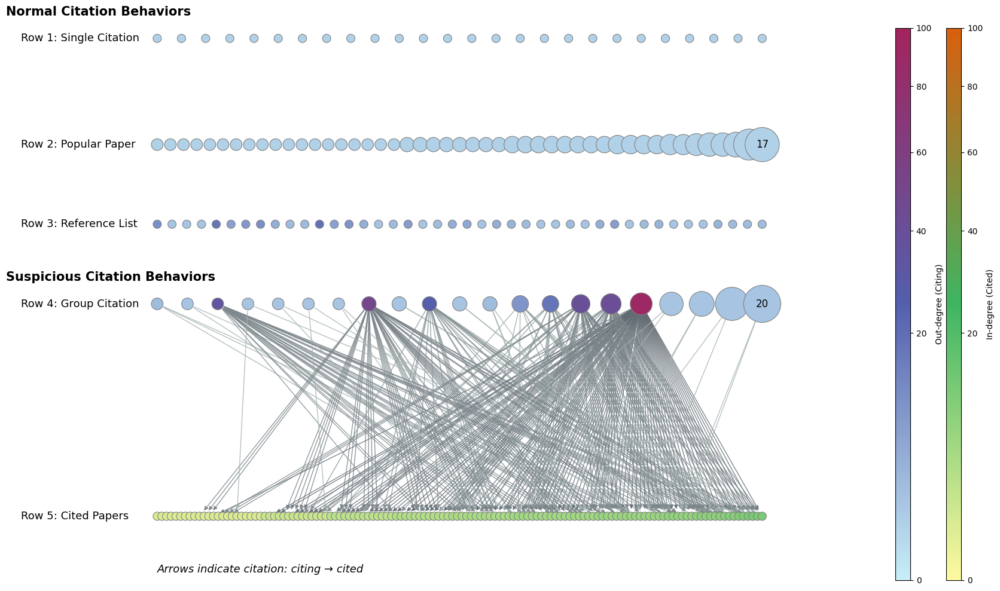

[Stats] Community 38 - Row4 super nodes: 24
super_node  num_nodes_in_super  num_out_edges                                                                            members
 Super_125                  16              6 7426,7428,7429,7432,7433,7434,7435,7436,7438,7439,7440,7441,7442,7443,7445,7606...
  Super_76                  14              6           7262,7263,7264,7296,7297,7298,7303,7304,7305,7307,7308,7309,7311,7312...
 Super_131                   8              2                                         7463,7468,7470,7472,7473,7474,7477,7478...
 Super_123                   4              3                                                             7420,7454,7456,7458...
 Super_121                   3              6                                                                  7417,7423,7424...
  Super_80                   3              2                                                                  7269,7315,7316...
  Super_84                   2             20        

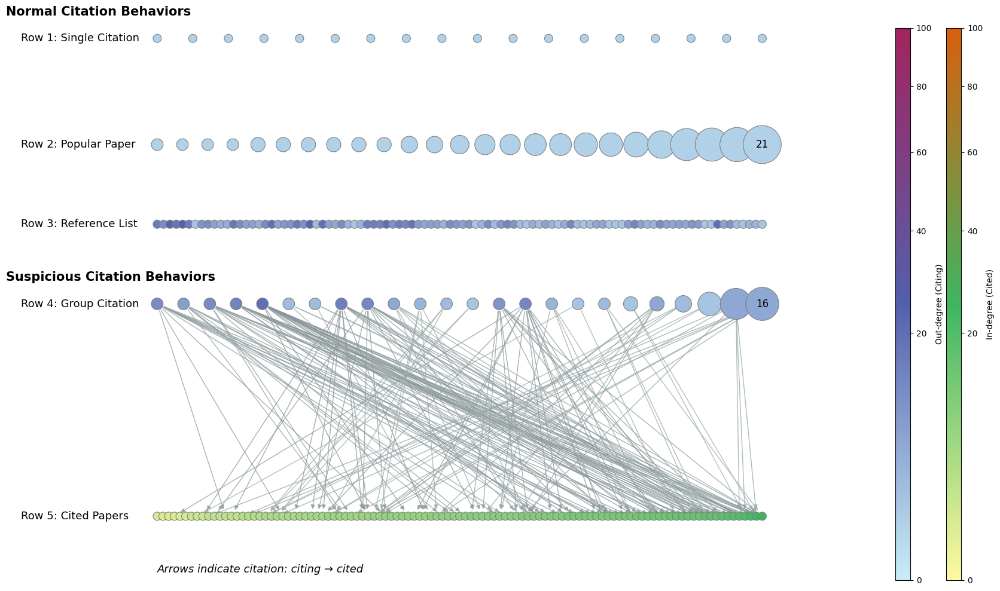

[Stats] Community 3 - Row4 super nodes: 8
super_node  num_nodes_in_super  num_out_edges                                     members
  Super_66                  10             60 404,406,407,410,412,414,419,420,466,1227...
  Super_64                   6             45                  397,398,400,401,402,411...
  Super_74                   3             34                           1079,1081,1084...
  Super_65                   3             12                              673,740,749...
  Super_76                   2              9                                  478,479...
  Super_77                   2              9                                1134,1151...
  Super_97                   2              5                                1246,1252...
 Super_107                   2              2                                3689,3690...
[Stats] Saved: data/pred/metadata/louvain/network_diagram/row4_supernode_stats_com_3.csv


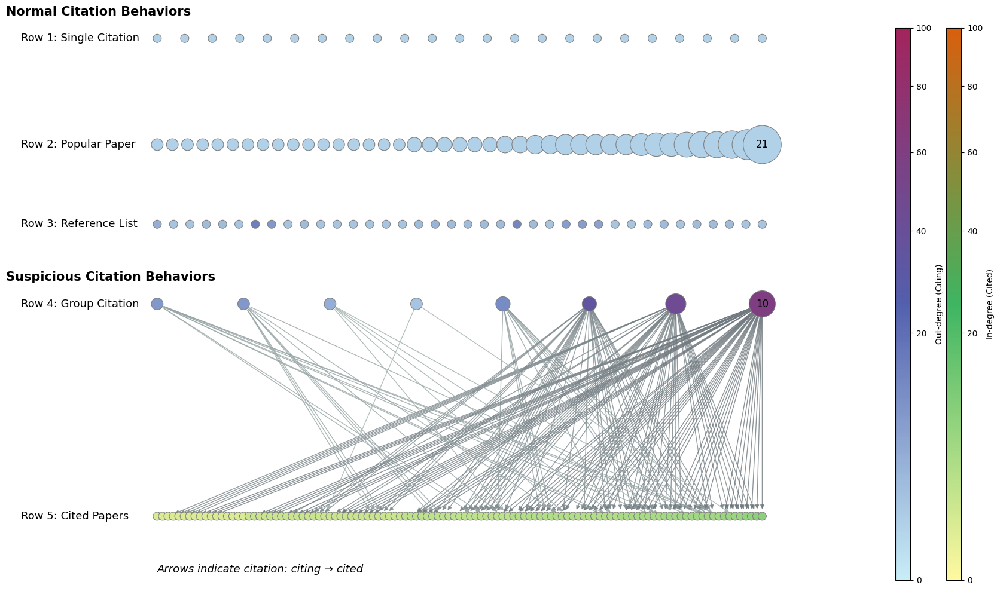

In [91]:
def main():
    # Pred Data:
    csv_file = "data/pred/metadata/louvain/best_louvain_reso_1.8.csv" 
    edge_list_file = "data/pred/metadata/edge_list.txt" 
    save_folder = "data/pred/metadata/louvain/network_diagram"

    community_data = pd.read_csv(csv_file)
    top_communities = community_data.nlargest(5, 'Number of Nodes').reset_index(drop=True)

    for rank, row in top_communities.iterrows():
        target_community_id = row['Community ID']
        all_nodes = set(map(int, row['Nodes'].split(',')))
        filtered_edges = filter_edge_list(edge_list_file, all_nodes)

        visualize_5_rows_with_custom_colors(
            filtered_edges,
            community_data,
            target_community_id,
            rank + 1, 
            save_folder,
            out_deg_max=100,
            in_deg_max=100,
            blue_colors=["#c8edf7", "#535fad", "#a3245d"],
            orange_colors=["#fff9a0", "#3eb562", "#d95f0e"]
        )

if __name__ == "__main__":
    main()

Draw citation network for a specific community

[Stats] Community 14 - Row4 super nodes: 21
super_node  num_nodes_in_super  num_out_edges                                                                                                members
 Super_128                  20              2 3821,3822,3823,3824,3825,3826,3827,3828,3829,3830,3831,3832,3834,3835,3836,3837,3838,3839,3840,3841...
 Super_130                  16              2                     3845,3848,3849,3850,3851,3853,3854,3855,3856,3857,3858,3860,3861,3862,3863,3864...
 Super_133                   9              2                                                        3867,3868,3869,3870,3871,3872,3873,3874,3875...
 Super_110                   8              2                                                             1435,1438,1439,1440,1441,1442,1444,1445...
  Super_74                   7             91                                                                         474,476,477,487,488,489,491...
  Super_81                   6             42                 

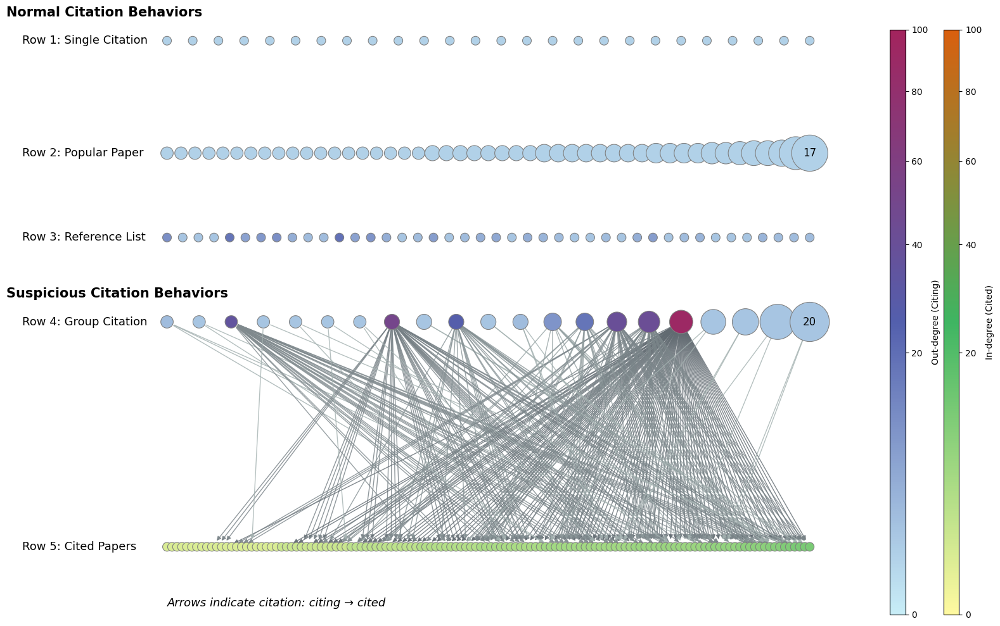

In [19]:
DATASET = "pred"     # "norm" 或 "pred"
COMMUNITY_ID =14  

def main():
    if DATASET == "norm":
        csv_file = "data/norm/metadata/louvain/best_louvain_reso_0_8.csv"
        edge_list_file = "data/norm/metadata/edge_list.txt"
        save_folder = "data/norm/metadata/louvain/network_diagram"
    elif DATASET == "pred":
        csv_file = "data/pred/metadata/louvain/best_louvain_reso_1.8.csv"
        edge_list_file = "data/pred/metadata/edge_list.txt"
        save_folder = "data/pred/metadata/louvain/network_diagram"
    else:
        raise ValueError("DATASET can only be 'norm' or 'pred'")

    if COMMUNITY_ID is None:
        raise ValueError("Set COMMUNITY_ID。")

    os.makedirs(save_folder, exist_ok=True)

    community_data = pd.read_csv(csv_file)

    row = community_data[community_data['Community ID'] == int(COMMUNITY_ID)]
    if row.empty:
        raise ValueError(f"Can't find Community ID = {COMMUNITY_ID}（in {DATASET}")

    all_nodes = set(map(int, str(row.iloc[0]['Nodes']).split(',')))
    filtered_edges = filter_edge_list(edge_list_file, all_nodes)

    visualize_5_rows_with_custom_colors(
        filtered_edges,
        community_data,
        int(COMMUNITY_ID),
        1,
        save_folder,
        out_deg_max=100,
        in_deg_max=100,
        blue_colors=["#c8edf7", "#535fad", "#a3245d"],
        orange_colors=["#fff9a0", "#3eb562", "#d95f0e"]
    )

if __name__ == "__main__":
    main()


<h1>Step 3: Find the most similar communities between Pred and Norm Sets to compare</h1>

In [14]:
import pandas as pd

def load_communities(csv_file):
    df = pd.read_csv(csv_file, header=None, names=["CommunityID", "NumNodes", "Nodes"])
    communities = {}
    for _, row in df.iterrows():
        comm_id = str(row["CommunityID"]).strip()
        nodes_str = str(row["Nodes"]).strip().strip('"').replace("[","").replace("]","")
        nodes = set(n.strip() for n in nodes_str.split(",") if n.strip())
        communities[comm_id] = nodes
    return communities

def load_edge_list(edge_file):
    edges = []
    with open(edge_file, 'r', encoding="utf-8") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) >= 2:
                source, target = str(parts[0]).strip(), str(parts[1]).strip()
                edges.append((source, target))
    return edges

def compute_community_metrics(community_nodes, edges):
    community_edges = [(s, t) for s, t in edges if s in community_nodes and t in community_nodes]

    total_nodes = len(community_nodes)
    total_edges = len(community_edges)

    citing_nodes = set(s for s, t in community_edges)
    citing_count = len(citing_nodes)

    cited_nodes = set(t for s, t in community_edges)
    cited_count = len(cited_nodes)

    prop_citing = (citing_count / total_nodes) if total_nodes > 0 else 0.0
    prop_cited  = (cited_count  / total_nodes) if total_nodes > 0 else 0.0

    return {
        "total_nodes": total_nodes,
        "total_edges": total_edges,
        "citing_count": citing_count,
        "cited_count": cited_count,
        "prop_citing": prop_citing,
        "prop_cited":  prop_cited
    }

def similarity_component(a, b):
    s = a + b
    if s == 0:
        return 1.0
    v = 1.0 - abs(a - b) / s
    return max(0.0, min(1.0, v))

def compute_similarity(m1, m2):
    """
    Core: Compares the two sides' internal communities.
    - prop_citing: The percentage of nodes that "issue citations" within the community.
    - prop_cited: The percentage of nodes that "be cited" within the community.
    default overall = (score_prop_citing + score_prop_cited) / 2
    """
    score_prop_citing = similarity_component(m1["prop_citing"], m2["prop_citing"])
    score_prop_cited  = similarity_component(m1["prop_cited"],  m2["prop_cited"])

    # score_nodes = similarity_component(m1["total_nodes"], m2["total_nodes"])
    # score_edges = similarity_component(m1["total_edges"], m2["total_edges"]) if (m1["total_edges"] + m2["total_edges"]) > 0 else 1.0
    # overall = (0.4*(score_prop_citing + score_prop_cited) + 0.1*score_nodes + 0.1*score_edges)

    overall = (score_prop_citing + score_prop_cited) / 2.0
    details = {
        "score_prop_citing": score_prop_citing,
        "score_prop_cited":  score_prop_cited,
        # "score_nodes": score_nodes,
        # "score_edges": score_edges,
    }
    return overall, details

def main():
    good_comm_file = "data/norm/metadata/louvain/best_louvain_reso_1.csv"
    bad_comm_file  = "data/pred/metadata/louvain/best_louvain_reso_1.8.csv"
    good_edge_file = "data/norm/metadata/edge_list.txt"
    bad_edge_file  = "data/pred/metadata/edge_list.txt"

    good_communities = load_communities(good_comm_file)
    bad_communities  = load_communities(bad_comm_file)
    good_edges = load_edge_list(good_edge_file)
    bad_edges  = load_edge_list(bad_edge_file)

    good_metrics = {cid: compute_community_metrics(nodes, good_edges) for cid, nodes in good_communities.items()}
    bad_metrics  = {cid: compute_community_metrics(nodes, bad_edges)  for cid, nodes in bad_communities.items()}

    MIN_N = 300
    good_filtered = {cid:m for cid,m in good_metrics.items() if m["total_nodes"] >= MIN_N}
    bad_filtered  = {cid:m for cid,m in bad_metrics.items()  if m["total_nodes"] >= MIN_N}

    if not good_filtered or not bad_filtered:
        raise ValueError("Not such community after filter")

    best_score = -1.0
    best_pair = None
    best_detail = None

    for g_comm, g_met in good_filtered.items():
        for b_comm, b_met in bad_filtered.items():
            sim_score, detail_scores = compute_similarity(g_met, b_met)
            if sim_score > best_score:
                best_score = sim_score
                best_pair = (g_comm, b_comm)
                best_detail = detail_scores

    print("\nMost similar community pair (by proportions):")
    print("Norm community ID:", best_pair[0], "Metrics:", good_filtered[best_pair[0]])
    print("Pred community ID:", best_pair[1], "Metrics:", bad_filtered[best_pair[1]])
    print("Final similarity score:", round(best_score, 6))
    print("Detail (prop-based):", best_detail)

if __name__ == '__main__':
    main()



Most similar community pair (by proportions):
Norm community ID: 176 Metrics: {'total_nodes': 319, 'total_edges': 350, 'citing_count': 314, 'cited_count': 15, 'prop_citing': 0.9843260188087775, 'prop_cited': 0.047021943573667714}
Pred community ID: 19 Metrics: {'total_nodes': 808, 'total_edges': 1483, 'citing_count': 787, 'cited_count': 44, 'prop_citing': 0.974009900990099, 'prop_cited': 0.054455445544554455}
Final similarity score: 0.96074
Detail (prop-based): {'score_prop_citing': 0.9947322021138549, 'score_prop_cited': 0.9267472090533722}


<h1> Step 4: Group-citation performance in overall dataste</h1>

In [16]:
import pandas as pd
import networkx as nx
from statsmodels.stats.proportion import proportions_ztest

def load_edge_list(path):
    edge_list = []
    with open(path, 'r') as f:
        for line in f:
            src, dst = map(int, line.strip().split())
            edge_list.append((src, dst))
    return edge_list

def analyze_group_citation(csv_file, edge_list_file):
    df = pd.read_csv(csv_file)
    edge_list = load_edge_list(edge_list_file)

    total_communities = df.shape[0]
    total_citing_nodes = 0
    total_row4_nodes = 0
    row4_out_degrees = []
    binary_group_citation = []
    row4_supernode_sizes = []

    for _, row in df.iterrows():
        com_nodes = list(map(int, row['Nodes'].split(',')))
        sub_edges = [(s, t) for (s, t) in edge_list if s in com_nodes and t in com_nodes]
        G = nx.DiGraph()
        G.add_edges_from(sub_edges)

        citing_nodes = [n for n in G.nodes if G.out_degree(n) > 0]
        row4_nodes = [n for n in citing_nodes if G.out_degree(n) > 1]

        total_citing_nodes += len(citing_nodes)
        total_row4_nodes += len(row4_nodes)
        row4_out_degrees.extend([G.out_degree(n) for n in row4_nodes])
        binary_group_citation.append(1 if len(row4_nodes) > 0 else 0)

        # Count the size of the group citation supernode (i.e. the number of papers merged)
        for n in row4_nodes:
            out_nbrs = set(G[n])
            size = 1  # Default single node
            for m in G.nodes():
                if m != n and set(G[m]) == out_nbrs:
                    size += 1
            row4_supernode_sizes.append(size)

    prop_row4 = total_row4_nodes / total_citing_nodes
    avg_out_degree = sum(row4_out_degrees) / len(row4_out_degrees) if row4_out_degrees else 0
    avg_row4_super_size = sum(row4_supernode_sizes) / len(row4_supernode_sizes) if row4_supernode_sizes else 0

    return {
        "total_communities": total_communities,
        "total_citing_nodes": total_citing_nodes,
        "row4_nodes": total_row4_nodes,
        "prop_row4": prop_row4,
        "avg_out_degree": avg_out_degree,
        "avg_supernode_size": avg_row4_super_size,
        "binary_labels": binary_group_citation
    }

pred_csv  = "data/pred/metadata/louvain/best_louvain_reso_1.8.csv"
pred_edge = "data/pred/metadata/edge_list.txt"
reg_csv = "data/norm/metadata/louvain/best_louvain_reso_1.csv"
reg_edge  = "data/norm/metadata/edge_list.txt"

res_pred = analyze_group_citation(pred_csv, pred_edge)
res_reg = analyze_group_citation(reg_csv, reg_edge)

# proportion z-test
count = [sum(res_pred['binary_labels']), sum(res_reg['binary_labels'])]
nobs = [len(res_pred['binary_labels']), len(res_reg['binary_labels'])]
z_stat, p_val = proportions_ztest(count, nobs)

print("=== Predatory Dataset ===")
print(f"Total communities: {res_pred['total_communities']}")
print(f"Total citing nodes: {res_pred['total_citing_nodes']}")
print(f"Row 4 (Group citation) nodes: {res_pred['row4_nodes']}")
print(f"Proportion of group citation: {res_pred['prop_row4']:.4f}")
print(f"Average out-degree of Row 4 nodes: {res_pred['avg_out_degree']:.2f}")
print(f"Group citation present in communities: {count[0]}/{nobs[0]}")
print(f"Average Row 4 supernode size: {res_pred['avg_supernode_size']:.2f}")


print("\n=== Regular Dataset ===")
print(f"Total communities: {res_reg['total_communities']}")
print(f"Total citing nodes: {res_reg['total_citing_nodes']}")
print(f"Row 4 (Group citation) nodes: {res_reg['row4_nodes']}")
print(f"Proportion of group citation: {res_reg['prop_row4']:.4f}")
print(f"Average out-degree of Row 4 nodes: {res_reg['avg_out_degree']:.2f}")
print(f"Group citation present in communities: {count[1]}/{nobs[1]}")
print(f"Average Row 4 supernode size: {res_reg['avg_supernode_size']:.2f}")


print("\n=== Proportion Z-Test ===")
print(f"z = {z_stat:.3f}, p = {p_val:.5f}")


=== Predatory Dataset ===
Total communities: 178
Total citing nodes: 6011
Row 4 (Group citation) nodes: 1587
Proportion of group citation: 0.2640
Average out-degree of Row 4 nodes: 8.83
Group citation present in communities: 42/178
Average Row 4 supernode size: 4.13

=== Regular Dataset ===
Total communities: 179
Total citing nodes: 7907
Row 4 (Group citation) nodes: 798
Proportion of group citation: 0.1009
Average out-degree of Row 4 nodes: 2.56
Group citation present in communities: 59/179
Average Row 4 supernode size: 8.06

=== Proportion Z-Test ===
z = -1.964, p = 0.04949


<h3>Apply AI Ratio</h3>

In [72]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
import matplotlib.colors as mcolors
import os
from mpl_toolkits.axes_grid1 import make_axes_locatable

def visualize_5_rows_with_AI_colors(edge_list, community_data, community_id, rank, save_folder,
                                        vote_results_pkl,
                                        out_deg_max=100):
  
    df_votes = pd.read_pickle(vote_results_pkl)
    ai_dict = {}
    for _, row_vote in df_votes.iterrows():
        ai_dict[row_vote['paper_id']] = 1 if row_vote['final_decision'] == 'AI' else 0

    row = community_data[community_data['Community ID'] == community_id]
    if row.empty:
        print(f"Community {community_id} not found.")
        return

    node_list = list(map(int, row.iloc[0]['Nodes'].split(',')))

    G = nx.DiGraph()
    sub_edges = [(s, t) for s, t in edge_list if s in node_list and t in node_list]
    G.add_edges_from(sub_edges)

    super_graph, node_map = new_create_super_nodes(G)

    for super_node, papers in node_map.items():
        ai_count = sum(ai_dict.get(p, 0) for p in papers)
        ai_ratio = ai_count / len(papers)
        super_graph.nodes[super_node]['ai_ratio'] = ai_ratio

    for node in super_graph.nodes():
        if node not in node_map:
            super_graph.nodes[node]['ai_ratio'] = ai_dict.get(node, 0)

    def is_real_super(n):
        return isinstance(n, str) and n.startswith("Super_") and super_graph.nodes[n].get('size', 1) > 1

    target_nodes = [n for n in super_graph.nodes() if super_graph.out_degree(n) == 0]
    blue_nodes   = [n for n in super_graph.nodes() if super_graph.out_degree(n) > 0]

    row1_nodes = [n for n in blue_nodes if super_graph.out_degree(n) == 1 and not is_real_super(n)]
    row2_nodes = [n for n in blue_nodes if super_graph.out_degree(n) == 1 and is_real_super(n)]
    row3_nodes = [n for n in blue_nodes if super_graph.out_degree(n) > 1 and not is_real_super(n)]
    row4_nodes = [n for n in blue_nodes if super_graph.out_degree(n) > 1 and is_real_super(n)]

    row2_nodes = sorted(row2_nodes, key=lambda n: super_graph.nodes[n].get('size', 1))
    row4_nodes = sorted(row4_nodes, key=lambda n: super_graph.nodes[n].get('size', 1))

    pos = {}

    def assign_positions(nodes, y_level):
        if not nodes:
            return
        x_coords = np.linspace(0, 2, len(nodes))
        for i, n in enumerate(nodes):
            pos[n] = (x_coords[i], y_level)

    assign_positions(row1_nodes, 0.85)
    assign_positions(row2_nodes, 0.7)
    assign_positions(row3_nodes, 0.55)
    assign_positions(row4_nodes, 0.4)

    target_nodes_sorted = sorted(target_nodes, key=lambda n: super_graph.in_degree(n))
    assign_positions(target_nodes_sorted, 0.0)

    ai_cmap = plt.cm.get_cmap('YlOrRd')      
    norm_ai = mpl.colors.Normalize(vmin=0, vmax=1)

    def get_ai_color(n):
        return ai_cmap(norm_ai(super_graph.nodes[n].get('ai_ratio', 0)))

    row1_colors = [get_ai_color(n) for n in row1_nodes]
    row2_colors = [get_ai_color(n) for n in row2_nodes]
    row3_colors = [get_ai_color(n) for n in row3_nodes]
    row4_colors = [get_ai_color(n) for n in row4_nodes]
    row5_colors = [get_ai_color(n) for n in target_nodes_sorted]

    def get_node_size(n):
        return super_graph.nodes[n].get('size', 1) * 100

    row1_sizes = [get_node_size(n) for n in row1_nodes]
    row2_sizes = [get_node_size(n) for n in row2_nodes]
    row3_sizes = [get_node_size(n) for n in row3_nodes]
    row4_sizes = [get_node_size(n) for n in row4_nodes]
    row5_sizes = [get_node_size(n) for n in target_nodes_sorted]

    edges_to_draw = [(u, v) for (u, v) in super_graph.edges() if u in row4_nodes]

    edge_cmap = mpl.colors.LinearSegmentedColormap.from_list("custom_grey", ["#aebdbb", "#5e666e"])
    edge_colors = [edge_cmap(mcolors.PowerNorm(gamma=0.5, vmin=0, vmax=out_deg_max)(super_graph.out_degree(u)))
                   for (u, v) in edges_to_draw]

    fig, ax = plt.subplots(figsize=(20, 11))

    ax.axis("off")

    nx.draw_networkx_nodes(super_graph, pos, nodelist=row1_nodes, node_color=row1_colors, node_size=row1_sizes,
                           alpha=1.0, ax=ax, linewidths=0.8, edgecolors='grey')
    nx.draw_networkx_nodes(super_graph, pos, nodelist=row2_nodes, node_color=row2_colors, node_size=row2_sizes,
                           alpha=1.0, ax=ax, linewidths=0.8, edgecolors='grey')
    nx.draw_networkx_nodes(super_graph, pos, nodelist=row3_nodes, node_color=row3_colors, node_size=row3_sizes,
                           alpha=1.0, ax=ax, linewidths=0.8, edgecolors='grey')
    nx.draw_networkx_nodes(super_graph, pos, nodelist=row4_nodes, node_color=row4_colors, node_size=row4_sizes,
                           alpha=1.0, ax=ax, linewidths=0.8, edgecolors='grey')
    nx.draw_networkx_nodes(super_graph, pos, nodelist=target_nodes_sorted, node_color=row5_colors, node_size=row5_sizes,
                           alpha=1.0, ax=ax, linewidths=0.8, edgecolors='grey')

    if row2_nodes:
        largest_row2 = max(row2_nodes, key=lambda n: super_graph.nodes[n].get('size', 1))
        ax.text(pos[largest_row2][0], pos[largest_row2][1],
                f"{super_graph.nodes[largest_row2].get('size', 1)}",
                fontsize=12, color='black', ha='center', va='center')

    if row4_nodes:
        largest_row4 = max(row4_nodes, key=lambda n: super_graph.nodes[n].get('size', 1))
        ax.text(pos[largest_row4][0], pos[largest_row4][1],
                f"{super_graph.nodes[largest_row4].get('size', 1)}",
                fontsize=12, color='black', ha='center', va='center')


    # if row2_nodes:
    #     largest_row2 = max(row2_nodes, key=lambda n: super_graph.nodes[n].get('size', 1))
    #     ax.annotate(f"Size: {super_graph.nodes[largest_row2].get('size', 1)}", 
    #                 xy=pos[largest_row2], 
    #                 xytext=(pos[largest_row2][0], pos[largest_row2][1] + 0.112),
    #                 arrowprops=dict(arrowstyle="->", color="black"),
    #                 fontsize=12, 
    #                 ha='center')

    # if row4_nodes:
    #     largest_row4 = max(row4_nodes, key=lambda n: super_graph.nodes[n].get('size', 1))
    #     ax.annotate(f"Size: {super_graph.nodes[largest_row4].get('size', 1)}", 
    #                 xy=pos[largest_row4], 
    #                 xytext=(pos[largest_row4][0], pos[largest_row4][1] + 0.1),
    #                 arrowprops=dict(arrowstyle="->", color="black"),
    #                 fontsize=12, 
    #                 ha='center')

    nx.draw_networkx_edges(super_graph, pos, edgelist=edges_to_draw, edge_color=edge_colors, width=1,
                           alpha=0.8, ax=ax)

    label_x = -0.5
    ax.text(-0.5, 0.95, "Normal Citation Behaviors", ha='left', va='center', fontsize=15, fontweight='bold')

    ax.text(label_x, 0.85, "Row 1: Single Citation", ha='left', va='center', fontsize=13)
    ax.text(label_x, 0.7, "Row 2: Popular Paper", ha='left', va='center', fontsize=13)
    ax.text(label_x, 0.55, "Row 3: Reference List", ha='left', va='center', fontsize=13)

    ax.text(-0.5, 0.45, "Suspicious Citation Behaviors", ha='left', va='center', fontsize=15, fontweight='bold')
    ax.text(label_x, 0.4, "Row 4: Group Citation", ha='left', va='center', fontsize=13)

    ax.text(label_x, 0.0, "Row 5: Cited Papers", ha='left', va='center', fontsize=13)

    ax.text(0, -0.1, "Arrows indicate citation: citing → cited", ha='left', va='center', fontsize=13, style='italic')

    divider = make_axes_locatable(ax)
    cax_ai = divider.append_axes("right", size="2%", pad=0.5)
    sm_ai = mpl.cm.ScalarMappable(norm=norm_ai, cmap=ai_cmap)
    cbar_ai = plt.colorbar(sm_ai, cax=cax_ai)
    cbar_ai.set_label('AI ratio', fontsize=10)

    ax.set_ylim(-0.10, 0.90) 
    all_x = [p[0] for p in pos.values()]  
    xmin = min(all_x)
    xmax = max(all_x)
    ax.set_xlim(xmin - 0.6, xmax + 0.4)

    output_path = os.path.join(save_folder, f"AI_ratio_{rank}_com_{community_id}.png")
    plt.savefig(output_path, format="png", dpi=300, bbox_inches='tight', pad_inches=0.09)
    plt.show()

Norm Data

/tmp/ipykernel_152080/3238163297.py:72: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ai_cmap = plt.cm.get_cmap('YlOrRd')


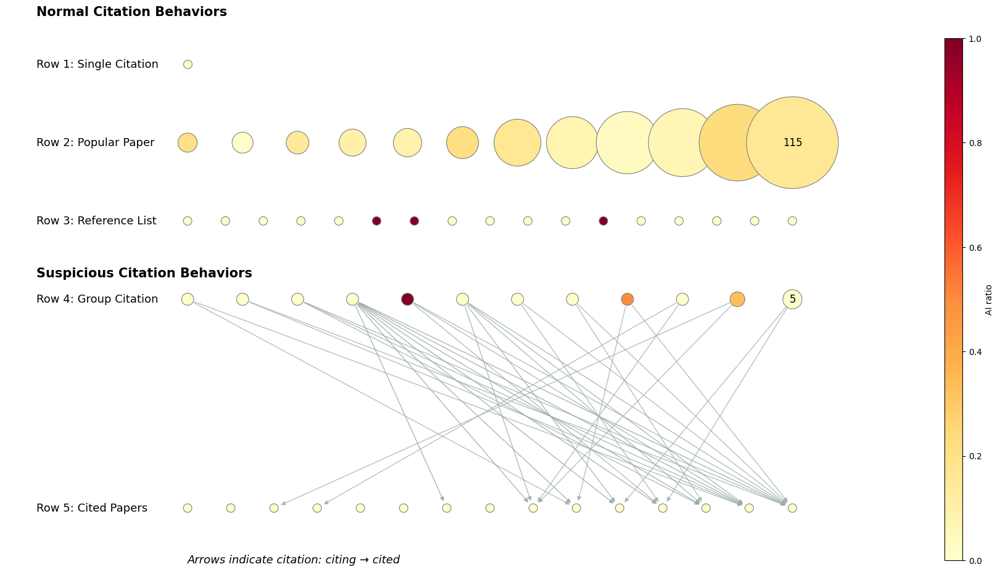

/tmp/ipykernel_152080/3238163297.py:72: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ai_cmap = plt.cm.get_cmap('YlOrRd')


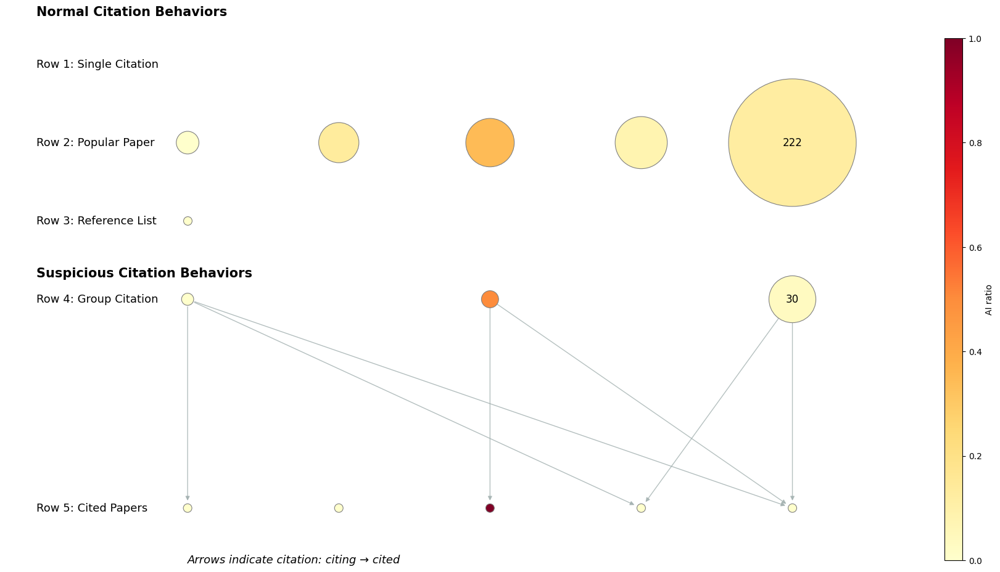

/tmp/ipykernel_152080/3238163297.py:72: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ai_cmap = plt.cm.get_cmap('YlOrRd')


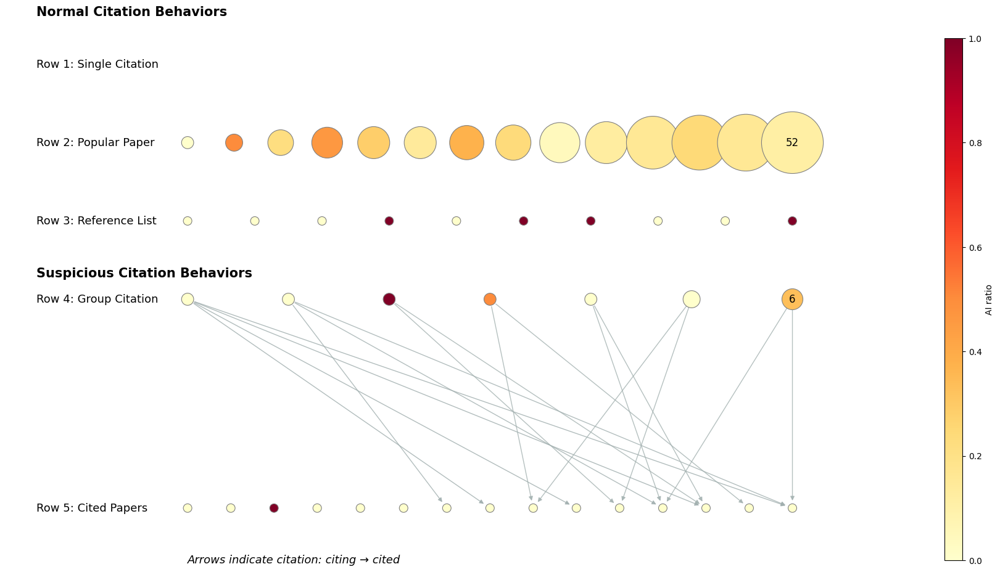

/tmp/ipykernel_152080/3238163297.py:72: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ai_cmap = plt.cm.get_cmap('YlOrRd')


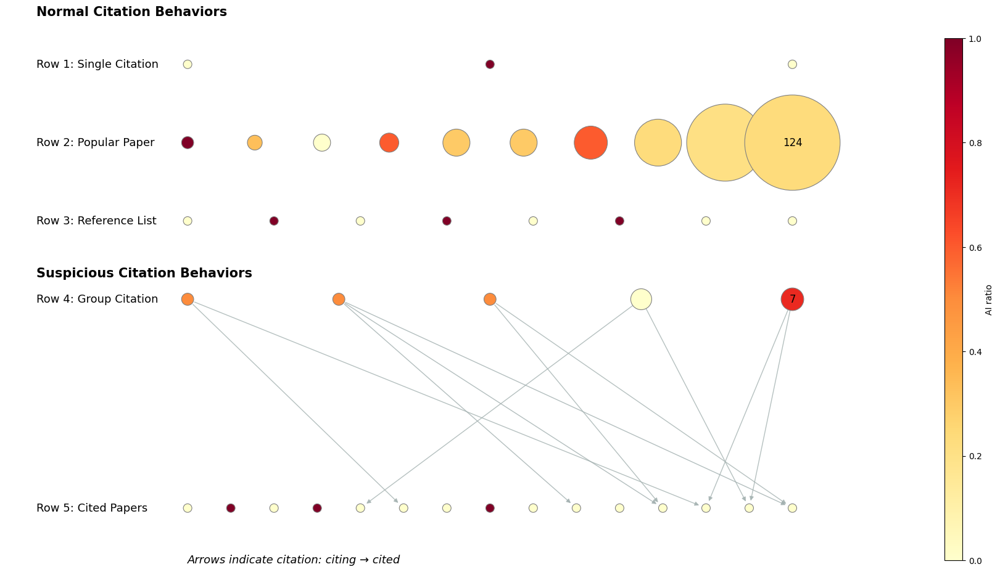

/tmp/ipykernel_152080/3238163297.py:72: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ai_cmap = plt.cm.get_cmap('YlOrRd')


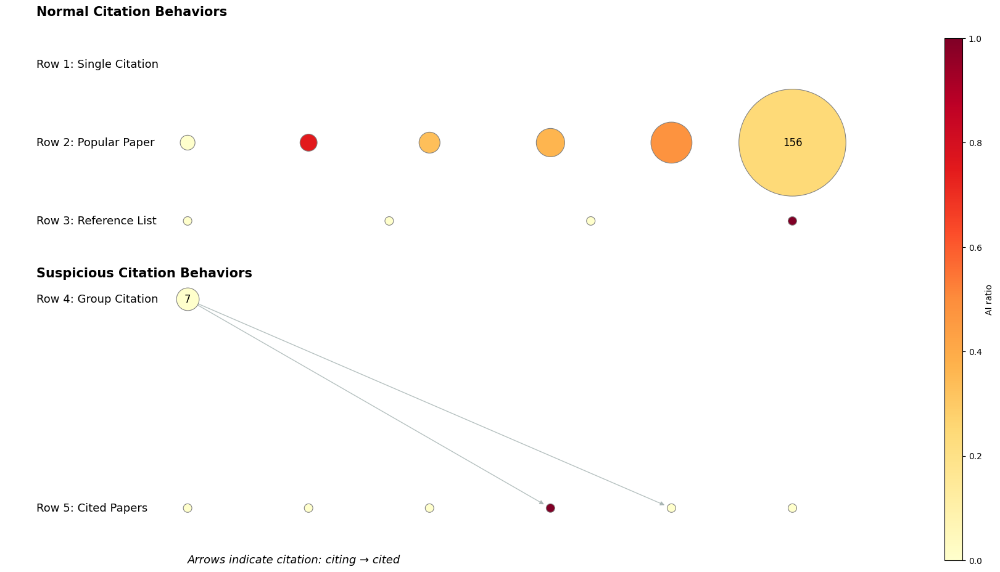

In [73]:
def main():
    csv_file = "data/norm/metadata/louvain/best_louvain_reso_1.csv"
    edge_list_file = "data/norm/metadata/edge_list.txt"
    save_folder = "data/norm/metadata/louvain/ai_network_diagram"
    vote_results_pkl = "data/norm/dataset/pkl/vote_results.pkl"

    community_data = pd.read_csv(csv_file)
    top_communities = community_data.nlargest(5, 'Number of Nodes').reset_index(drop=True)

    for rank, row in top_communities.iterrows():
        target_community_id = row['Community ID']
        all_nodes = set(map(int, row['Nodes'].split(',')))
        filtered_edges = filter_edge_list(edge_list_file, all_nodes)

        visualize_5_rows_with_AI_colors(
            filtered_edges,
            community_data,
            target_community_id,
            rank + 1,  
            save_folder,
            vote_results_pkl,
            out_deg_max=100
        )

if __name__ == "__main__":
    main()

Pred Data

/tmp/ipykernel_152080/3238163297.py:72: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ai_cmap = plt.cm.get_cmap('YlOrRd')


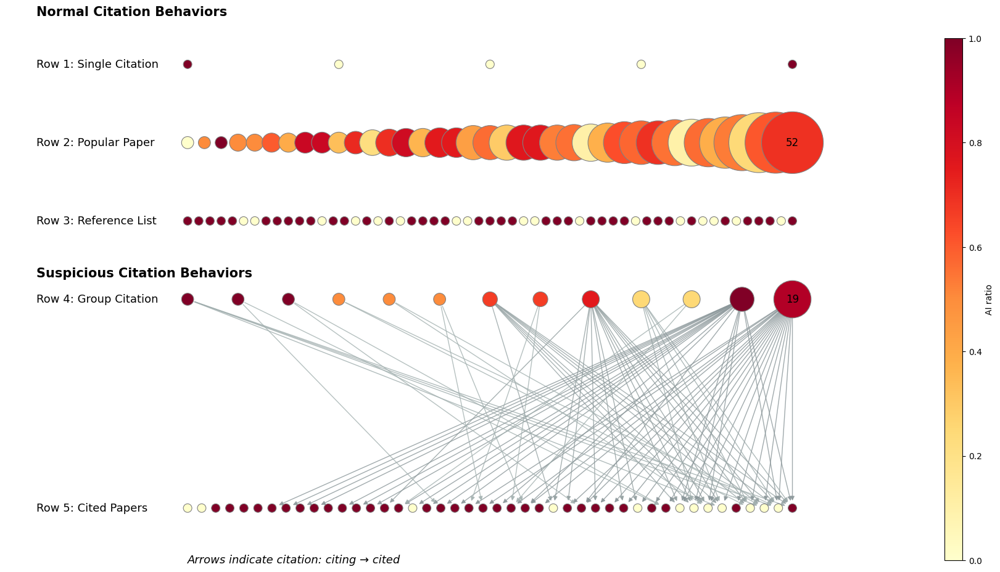

/tmp/ipykernel_152080/3238163297.py:72: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ai_cmap = plt.cm.get_cmap('YlOrRd')


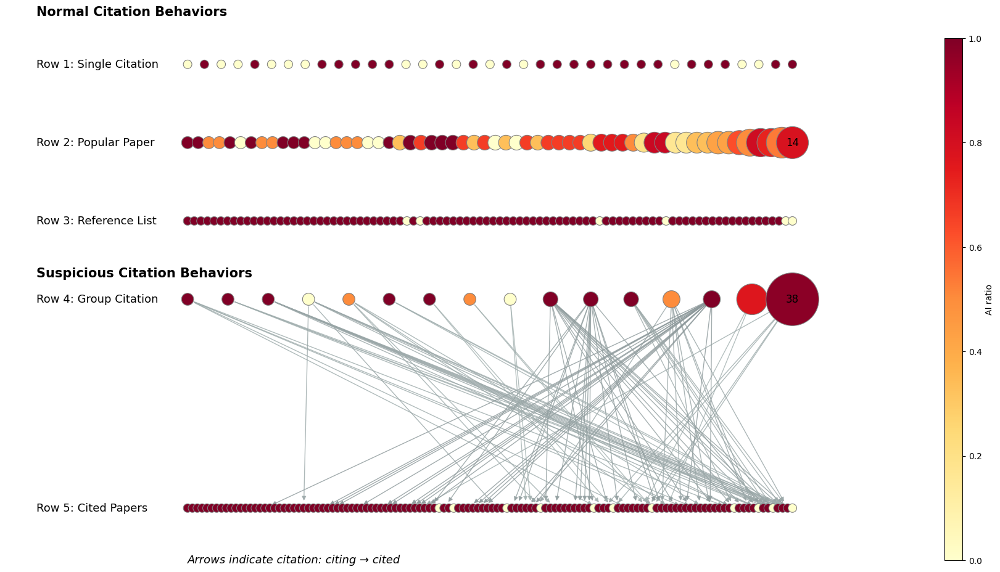

/tmp/ipykernel_152080/3238163297.py:72: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ai_cmap = plt.cm.get_cmap('YlOrRd')


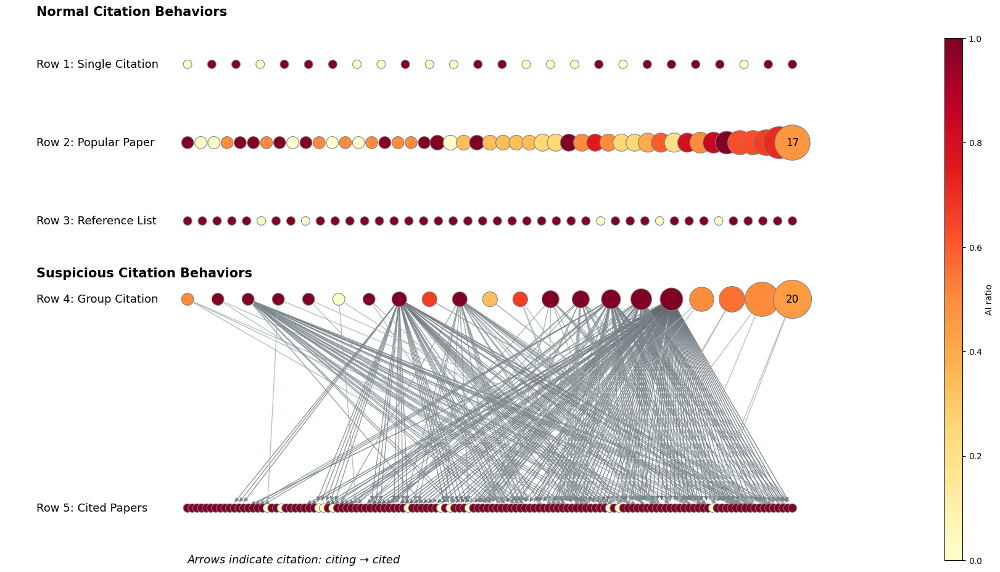

/tmp/ipykernel_152080/3238163297.py:72: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ai_cmap = plt.cm.get_cmap('YlOrRd')


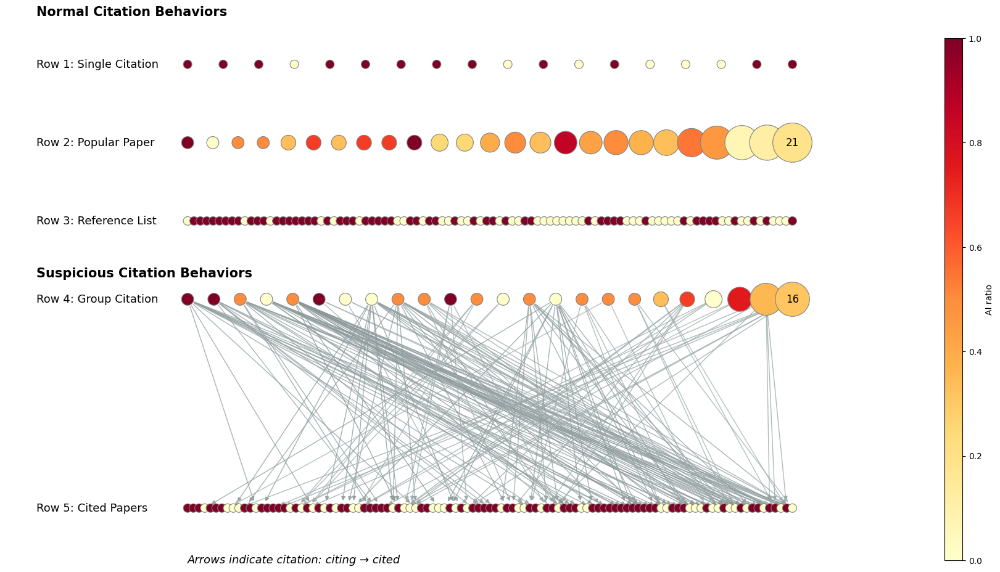

/tmp/ipykernel_152080/3238163297.py:72: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ai_cmap = plt.cm.get_cmap('YlOrRd')


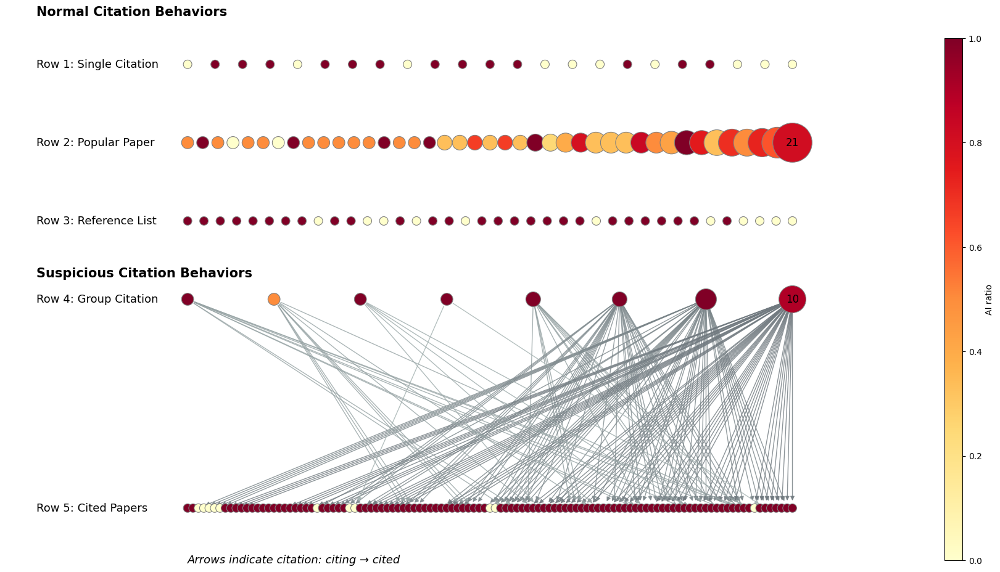

In [74]:
def main():
    # Bad
    csv_file = "data/pred/metadata/louvain/best_louvain_reso_1.8.csv"
    edge_list_file = "data/pred/metadata/edge_list.txt"
    save_folder = "data/pred/metadata/louvain/ai_network_diagram"
    vote_results_pkl = "data/pred/dataset/pkl/vote_results.pkl"

    community_data = pd.read_csv(csv_file)
    top_communities = community_data.nlargest(5, 'Number of Nodes').reset_index(drop=True)

    for rank, row in top_communities.iterrows():
        target_community_id = row['Community ID']
        all_nodes = set(map(int, row['Nodes'].split(',')))
        filtered_edges = filter_edge_list(edge_list_file, all_nodes)

        visualize_5_rows_with_AI_colors(
            filtered_edges,
            community_data,
            target_community_id,
            rank + 1,  
            save_folder,
            vote_results_pkl,
            out_deg_max=100
        )

if __name__ == "__main__":
    main()